# Working with AMBench data in SciServer

## Find, retrieve, and process image data for materials science

### Example science case: Use image processing to find the depth of a laser printing melt pool

#### This notebook executes a sample query to the AMBench metadata repository via its API, then retrieves and processes the records.  The script then performs some basic image analysis and plots the results.  

#### NOTE: The purpose of the notebook is to show a workflow that uses scripted access (via Python) to obtain and process data; image processing parameters and techniques were selected for this case and are not expected to be generally the best choices for other data or analysis.  Users should perform their own analyses to determine appropriate parameters and techniques for their problems of interest.

The data used in this demonstration comes from the 2018 AM-Bench challenge documented at https://www.nist.gov/ambench/amb2018-02-description.

The script queries the AM-Bench 2018 repository located at https://ambench.nist.gov/, then processes the returned XML-based results, processes the returned images using basic image analysis techniques, and generates plots of melt pool depths.

Additional datasets and challenge problem documentation are available through the NIST Public Data Repository record at https://data.nist.gov/od/id/6D6EC9B3A4147BE2E05324570681EEC91931 with an associated publication (https://link.springer.com/article/10.1007/s40192-020-00169-1) documenting the experiments.

# Setup: prepare the notebook

## Install and import required packages

First, we need to import packages that we will use to do the processing. Each import statement includes a comment describing what that package does.

#### The `pycdcs` package is used in this notebook to query the AMBench metadata repository that contains information about the AMBench 2018 data.

**Note:** This compute image should come pre-installed with `pycdcs`. If this image does not, then when you run the  code cell below, you will get an error that says `ModuleNotFoundError: No module named 'cdcs'`.

To fix that error, close this sample notebook. Open a new Terminal in SciServer Compute so you can run a command on the command line. Run the following command:

`pip install git+https://github.com/lmhale99/pycdcs`

Close down the terminal, open this notebook, and run the cell below.

In [1]:
# Package to find images in the AMBench repository
## This will allow us to find images to process
## These packages query NIST's Configurable Data Curation System (CDCS):
### https://www.nist.gov/itl/ssd/information-systems-group/configurable-data-curation-system-cdcs
from cdcs import CDCS 
print('Imported!')

Imported!


In [2]:
# Data processing packages
import pandas
import math
import numpy as np

#image_scale = 0.062   # Image scale in microns per pixel (here, 1 px = 0.062 microns)


# Package to parse metadata from the AMBench repo to find where to download image files
import lxml.etree as et

# Packages to download and save image files
import requests
from urllib import request
import os

# Packages to do image processing once we have the images downloaded
## From the scikit-image package; we only import the parts of the package that we need 
### scikit-image website: https://scikit-image.org/
from skimage import io              # read/write images
from skimage import filters         # apply filters to images
from skimage import segmentation    # divide image into sections
from skimage import morphology      # work with features found in image
from skimage import measure         # measure pixel sizes of features within image

# Packages to plot results
import matplotlib.pyplot as plt   
import matplotlib.image as mpimg  
import matplotlib.patches as patches


# Set pandas option to show the entire width of each column
pandas.set_option('display.max_colwidth', None)

print('Packages imported!')

Packages imported!


## Create functions

For some complex operations that we need to do repeatedly, it's easier to move the operations into a function call. This slows down the code slightly, but makes it much easier to read and to follow the logic of the notebook.

The function <code>xml_url_find</code> is defined below. It takes in the XML returned by CDCS and returns the URLs of the images to be used in image analysis.

In [3]:
# Function to get download links from XML returned by AMBench data repository
# function xml_url_find(xml,searchphrase,mtype):
## Inputs:
### xml: contents of XML file for one of the ambench.nist.gov datasets, in string format
### searchphrase: search phrase contained in the file name (in our case, "BF")
### mtype: filetype (in our case, "image/tiff")

## Returns:
### A four-item list containing:
#### (0) the name of the image file to be downloaded
#### (1) the URL at which to download the image file
#### (2) laser track number for that image
#### (3) case label for that image

def xml_url_find(xml,searchphrase,mtype):
    root=et.fromstring(xml)
    caseid=root.find('.//TraceID')[0].tag[5]
    track=root.find('.//TrackNumber')
    for element in root.iter('downloadURL'):
        u=request.urlopen(element.text)
        if (    # search XML to find searchphrase in filename and mytpe in file type
            (searchphrase in u.info().get_filename()) 
            and (mtype in u.info().get_content_type())
        ):
            name=u.info().get_filename()
            url=element.text
            return [name,url,track.text,caseid]


print('ok')

ok


# 1. Find datasets to work with

With setup done, we now begin the main part of the notebook by finding appropriate datasets.

The AMBench data repository includes hundreds of datasets associated with AMBench challenges. Each dataset includes metadata describing its purpose, and the conditions used to generate it. The actual data consists of images stored as .tiff files on a separate server at NIST. The datasets retreived from the data repository contain pointers to the image locations.

This section of the notebook searches the AMBench data repository for a keyword - in this case, "MP" (for "melt pool"). It then downloads the metadata for all public datasets with your selected keyword. You can see information about each returned dataset by running the code block with the `describe_datasets = True`.

In [4]:
keyword='MP'                # keyword to search data repository for: MP = melt pool
describe_datasets = True    # show name and basic metadata for each dataset
##show_dataset_xml = False     # show full metadata for each dataset (uses function show_xml, defined at the end of this notebook)

print('querying AMBench data repository for keyword {0:}...'.format(keyword))
curator = CDCS('https://ambench.nist.gov/', username='') # query repo (CDCS) anonymously
datasets_df = curator.query(  # search for results, return as a pandas dataframe:
    keyword=keyword,           ## results should match this keyword
    template='AM-Bench-2018'   ## and be associated with this tempalte
    ) 

### convert all date fields to pandas date format
for thiscol in ['creation_date', 'last_modification_date', 'last_change_date']:
    datasets_df.loc[:, thiscol] = pandas.to_datetime(datasets_df[thiscol], errors='coerce')
    
### use the dataset ID as the index of the dataframe, then sort by that ID    
datasets_df = datasets_df.set_index('id')

print('Found {0:,.0f} datasets matching keyword {1:}!'.format(len(datasets_df), keyword))
print('------------------------------------------------')

if (describe_datasets):
    for ix, thisrow in datasets_df.iterrows():
        print('\n')
        print('Dataset id = {0:}'.format(ix))
        print('\tTitle: {0:}'.format(thisrow['title']))
        print('\tCreated: {0:}'.format(thisrow['creation_date'].strftime('%Y-%m-%d')))
#         if (show_dataset_xml):
#             show_xml(thisrow['xml_content'])
        
print('------------------------------------------------')
print('Done!')

querying AMBench data repository for keyword MP...
Found 10 datasets matching keyword MP!
------------------------------------------------


Dataset id = 61e2e74036f033d46e0672b4
	Title: AMB2018-02-AMMT-625-TR6-MP.xml
	Created: 2021-09-02


Dataset id = 61e2e71747ed0ce2c83c23ac
	Title: AMB2018-02-AMMT-625-TR5-MP.xml
	Created: 2021-09-02


Dataset id = 61e2e700f51a62700be8516a
	Title: AMB2018-02-AMMT-625-TR8-MP.xml
	Created: 2021-09-02


Dataset id = 61e2e6a3e0ade599482c5b77
	Title: AMB2018-02-AMMT-625-TR2-MP.xml
	Created: 2021-09-02


Dataset id = 61e2e653b8edd76d53d3d54f
	Title: AMB2018-02-AMMT-625-TR3-MP.xml
	Created: 2021-09-02


Dataset id = 61e2e63bf51a62700be850ec
	Title: AMB2018-02-AMMT-625-TR10-MP.xml
	Created: 2021-09-02


Dataset id = 61e2e580d682ae6fb2db87af
	Title: AMB2018-02-AMMT-625-TR4-MP.xml
	Created: 2021-09-02


Dataset id = 61e2e52fe0ade599482c58ba
	Title: AMB2018-02-AMMT-625-TR9-MP.xml
	Created: 2021-09-02


Dataset id = 61e2e4c4b8edd76d53d3cb8e
	Title: AMB2018-02-A

# 2. Find download links for each dataset

Most of the metadata returned by the AMBench data repository is stored in XML format, easy for computers to store and process but hard for humans to read. One important piece of metadata in each dataset is a field called `downloadURL`, which gives the location where image(s) associated with that dataset can be downloaded.

This notebook includes a helper function called `xml_url_find` (defined in the "Create Functions" section above) that searches through the XML to find the download URL for each image to be processed. For this demo notebook, consider that function as a black box; if you want to learn how it works, see the function documentation in the setup step above. The `xml_url_find` function returns track, case, and image URL for each row in the dataset.



In [5]:
searchphrase='BF'  # used by function xml_url_find, don't worry about what it means now

datasets_df = datasets_df.assign(   # assign blanks to values to be computed later
    filename = np.nan, url = np.nan, track = np.nan, case = np.nan
) 

### Loop through all datasets and get track/case number and URL to download image
print('Finding URLs for images...')
cnt = 0
for ix, thisrow in datasets_df.iterrows():
    if (np.mod(cnt,5) == 0):
        print('\tFinding URL {0:,.0f} of {1:,.0f}...'.format(cnt+1, len(datasets_df)))
    datasets_df.loc[ix, 
                    ['filename', 'url', 'track', 'case']
                   ] = xml_url_find(thisrow['xml_content'],'BF','image/tiff') # giving xml_url_find each xml string and searching for
    cnt += 1


# set track to numeric, then sort by track
datasets_df.loc[:, 'track'] = pandas.to_numeric(
    datasets_df['track'], downcast='integer', errors='coerce'
)
datasets_df = datasets_df.sort_values(by='track') 

# assign blanks for values to compute later
datasets_df = datasets_df.assign(melt_pool_width_pixels = np.nan)
datasets_df = datasets_df.assign(melt_pool_depth_pixels = np.nan)
datasets_df = datasets_df.assign(melt_pool_width_microns = np.nan)
datasets_df = datasets_df.assign(melt_pool_depth_microns = np.nan)

print('\n')
print('Found download links for {0:,.0f} images!'.format(len(datasets_df['url'].dropna())))

datasets_df[['track', 'case', 'url', 'filename', 'melt_pool_width_pixels', 'melt_pool_depth_pixels', 'melt_pool_width_microns', 'melt_pool_depth_microns']]

Finding URLs for images...
	Finding URL 1 of 10...
	Finding URL 6 of 10...


Found download links for 10 images!


,track,case,url,filename,melt_pool_width_pixels,melt_pool_depth_pixels,melt_pool_width_microns,melt_pool_depth_microns
id,,,,,,,,
61e2e4c4b8edd76d53d3cb8e,1,C,https://ambench.nist.gov/rest/blob/download/61e2e4b4f51a62700be84de7,AMB18-02-AMMT-Trace01-50xBF-ZStk-EDF.tif,NaN,NaN,NaN,NaN
61e2e6a3e0ade599482c5b77,2,C,https://ambench.nist.gov/rest/blob/download/61e2e69426f0a0b0e709c6a4,AMB18-02-AMMT-Trace02-50xBF-ZStk-EDF.tif,NaN,NaN,NaN,NaN
61e2e653b8edd76d53d3d54f,3,C,https://ambench.nist.gov/rest/blob/download/61e2e63fb8edd76d53d3d4e1,AMB18-02-AMMT-Trace03-50xBF-ZStk-EDF.tif,NaN,NaN,NaN,NaN
61e2e580d682ae6fb2db87af,4,C,https://ambench.nist.gov/rest/blob/download/61e2e56df51a62700be8507a,AMB18-02-AMMT-Trace04-50xBF-ZStk-EDF.tif,NaN,NaN,NaN,NaN
61e2e71747ed0ce2c83c23ac,5,A,https://ambench.nist.gov/rest/blob/download/61e2e708b8edd76d53d3d8a0,AMB18-02-AMMT-Trace05-50xBF-ZStk-EDF.tif,NaN,NaN,NaN,NaN
61e2e74036f033d46e0672b4,6,A,https://ambench.nist.gov/rest/blob/download/61e2e72d26f0a0b0e709c949,AMB18-02-AMMT-Trace06-50xBF-ZStk-EDF.tif,NaN,NaN,NaN,NaN
61e2e46326f0a0b0e709c1df,7,A,https://ambench.nist.gov/rest/blob/download/61e2e44f47ed0ce2c83c2089,AMB18-02-AMMT-Trace07-50xBF-ZStk-EDF.tif,NaN,NaN,NaN,NaN
61e2e700f51a62700be8516a,8,B,https://ambench.nist.gov/rest/blob/download/61e2e6ede0ade599482c5c20,AMB18-02-AMMT-Trace08-50xBF-ZStk-EDF.tif,NaN,NaN,NaN,NaN
61e2e52fe0ade599482c58ba,9,B,https://ambench.nist.gov/rest/blob/download/61e2e51cdaebe69a45e91632,AMB18-02-AMMT-Trace09-50xBF-ZStk-EDF.tif,NaN,NaN,NaN,NaN


# 3. Download and process images

This code cell loops through each dataset you found in the previous section and performs the following operations on each (all the image processing is done using the `scikit` image processing package):

1. Downloads the image from the URL you found in the last section
1. Selects a smaller region of the image to work with (to save processing time)
1. Segments that region using the Felzenszwalb algorithm
1. Removes smaller regions (eliminate some background noise)
1. Acquires a table of center coordinates for each remaining region
1. Measures the distances from centers to the center of the entire relevant section image
1. Finds the index number of the closest region
1. Returns information about the closest region
1. Uses those results to measure the width and depth of the melt pool
1. Optionally displays the image with the relevant section marked and measured values displayed

Set `show_images = True` to see each image - first as the full image as returned by CDCS, and second as the cropped image 

The code cell below takes a few minutes to run.

Getting images...
	Getting image 1 of 10: track 1 case C...
Direct link to image file: https://ambench.nist.gov/rest/blob/download/61e2e4b4f51a62700be84de7
showing marked image...


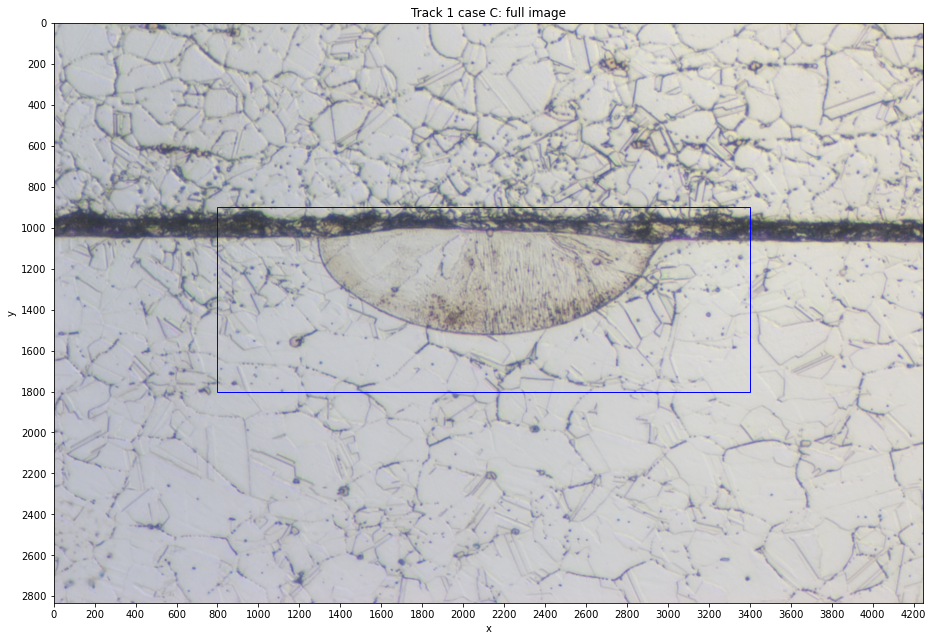

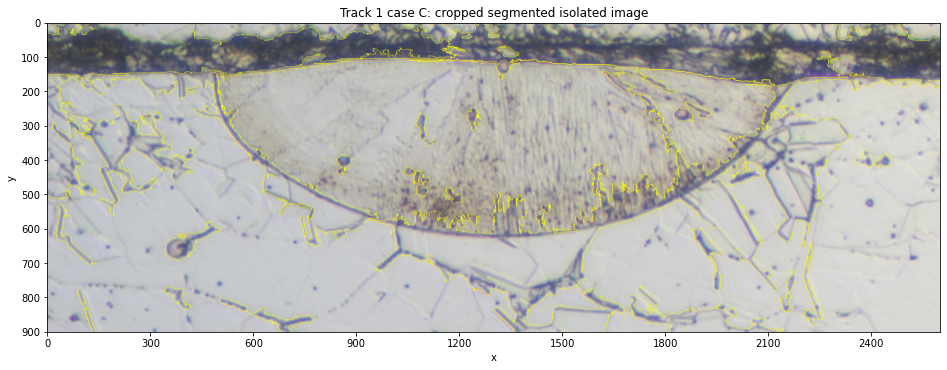

	Getting image 2 of 10: track 2 case C...
Direct link to image file: https://ambench.nist.gov/rest/blob/download/61e2e69426f0a0b0e709c6a4
showing marked image...


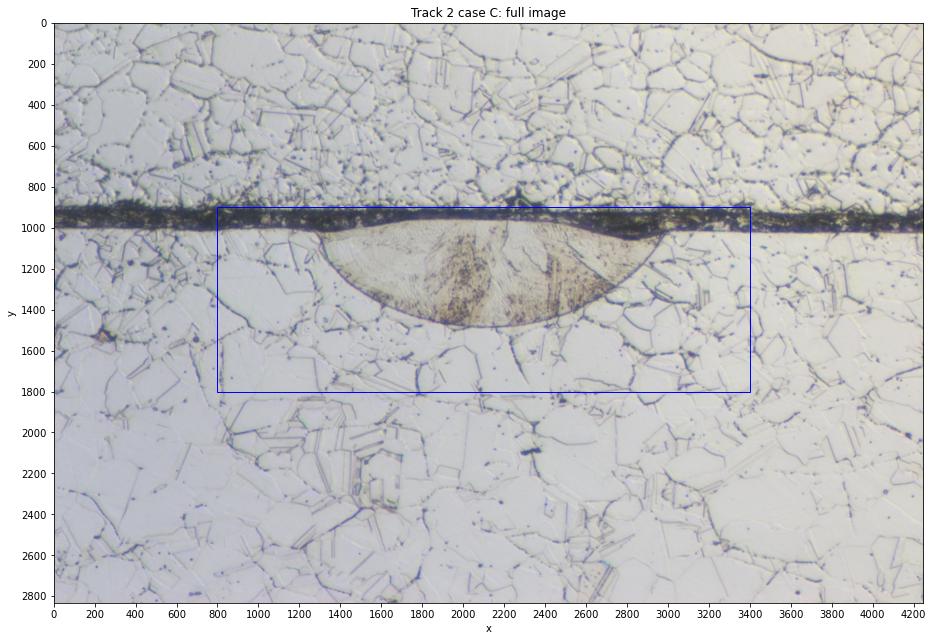

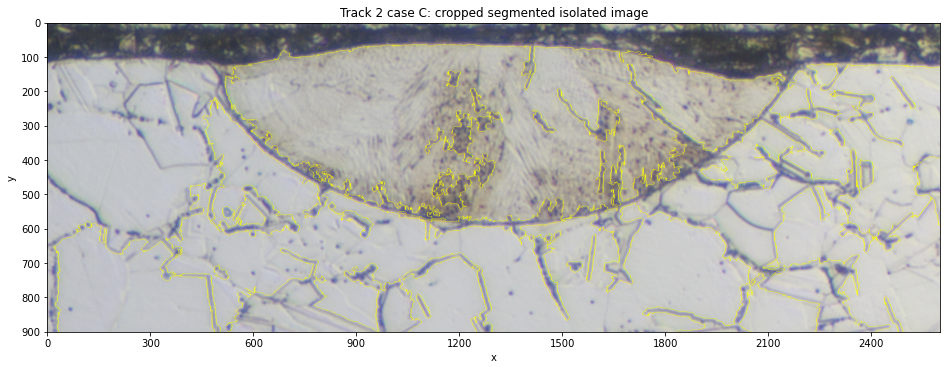

	Getting image 3 of 10: track 3 case C...
Direct link to image file: https://ambench.nist.gov/rest/blob/download/61e2e63fb8edd76d53d3d4e1
showing marked image...


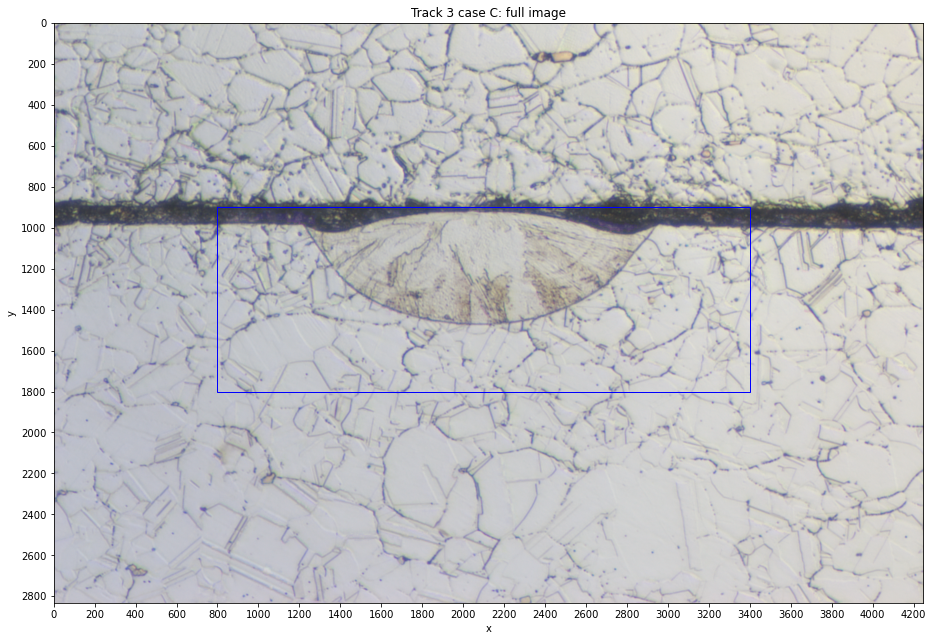

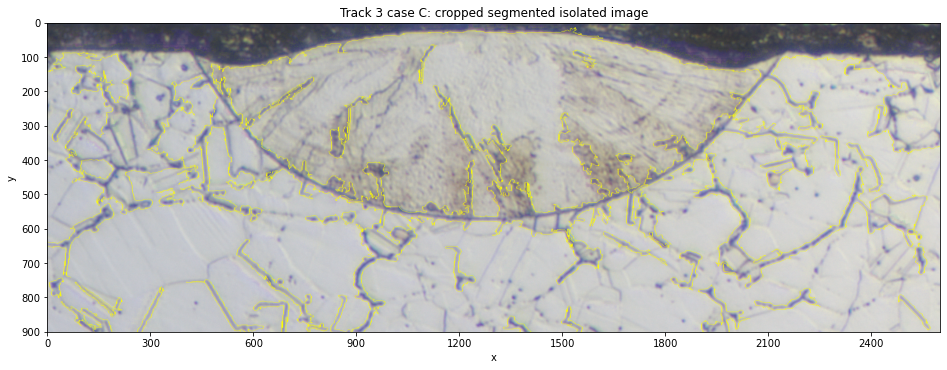

	Getting image 4 of 10: track 4 case C...
Direct link to image file: https://ambench.nist.gov/rest/blob/download/61e2e56df51a62700be8507a
showing marked image...


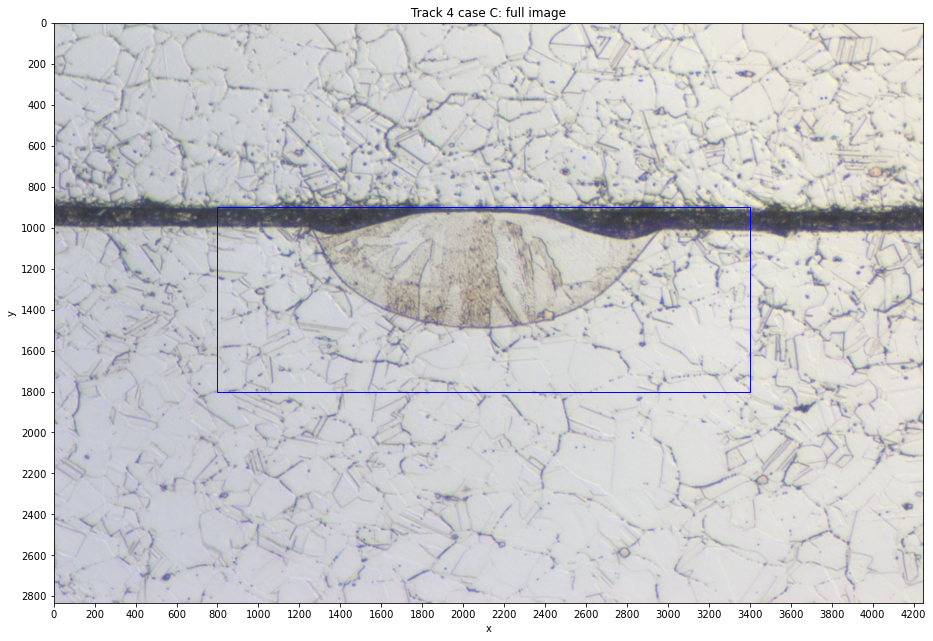

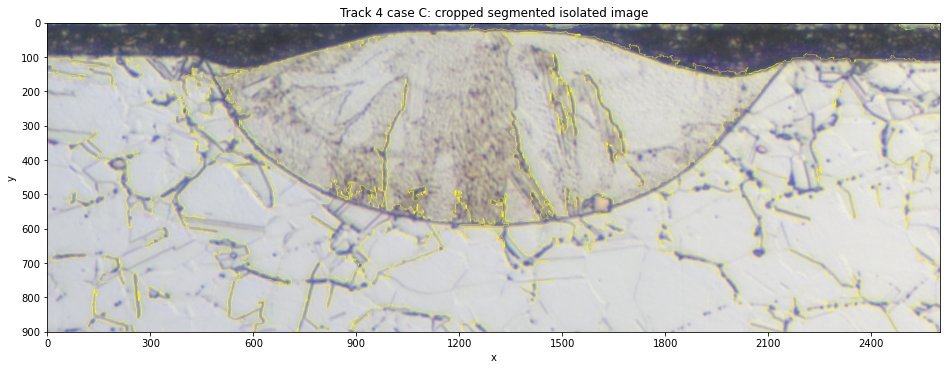

	Getting image 5 of 10: track 5 case A...
Direct link to image file: https://ambench.nist.gov/rest/blob/download/61e2e708b8edd76d53d3d8a0
showing marked image...


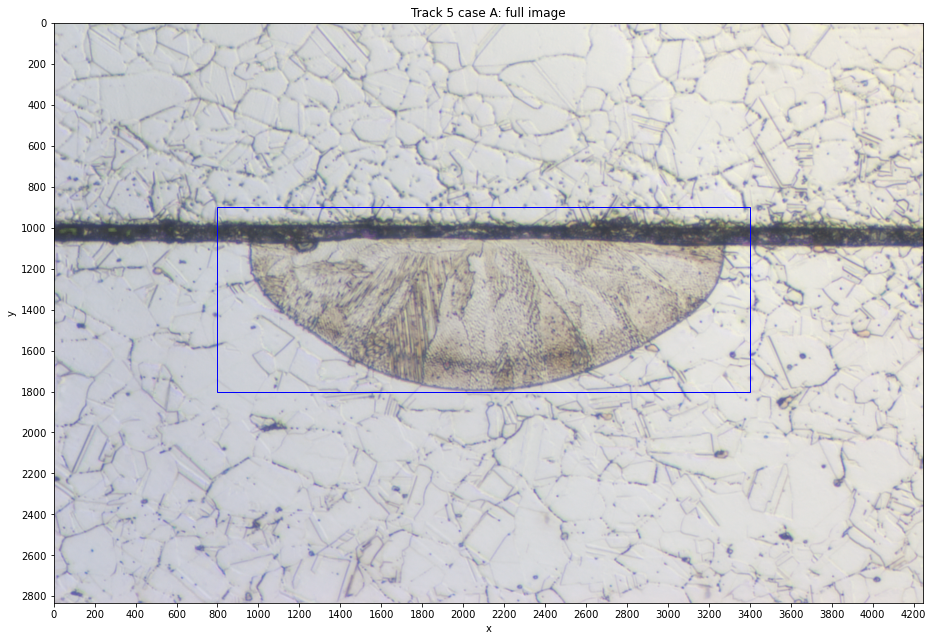

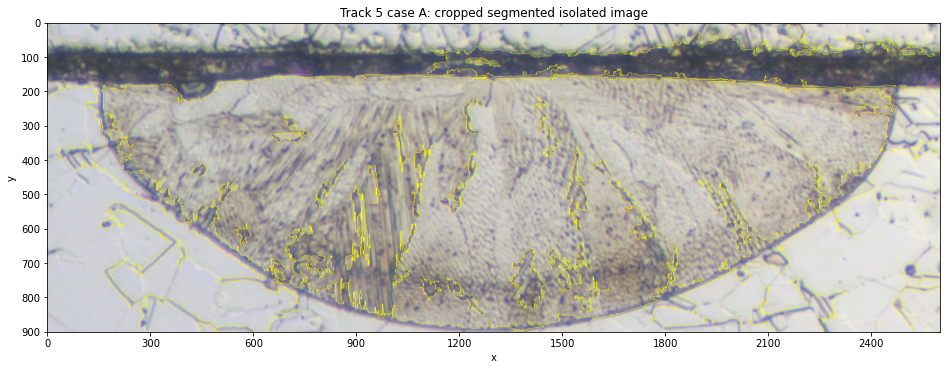

	Getting image 6 of 10: track 6 case A...
Direct link to image file: https://ambench.nist.gov/rest/blob/download/61e2e72d26f0a0b0e709c949
showing marked image...


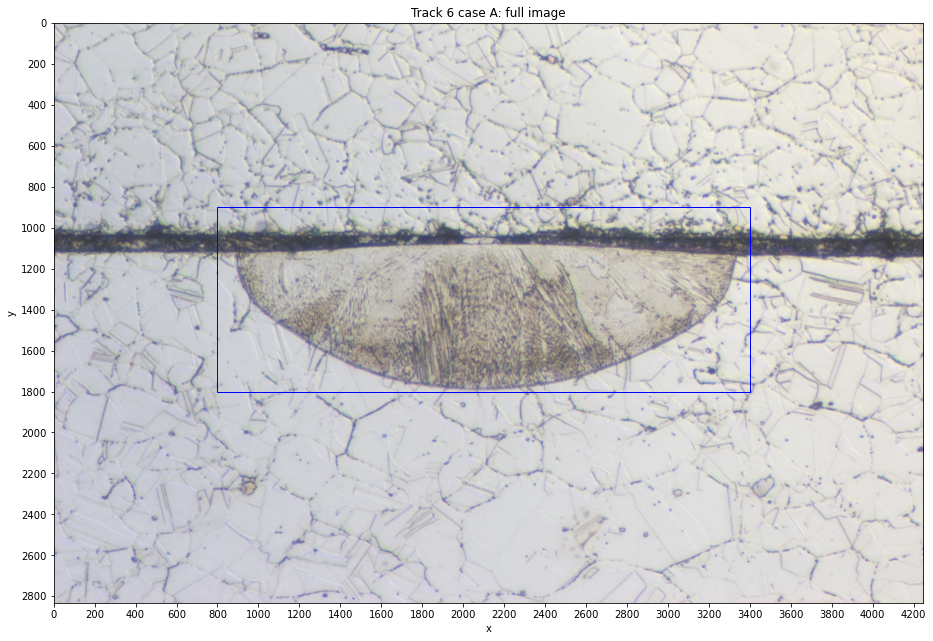

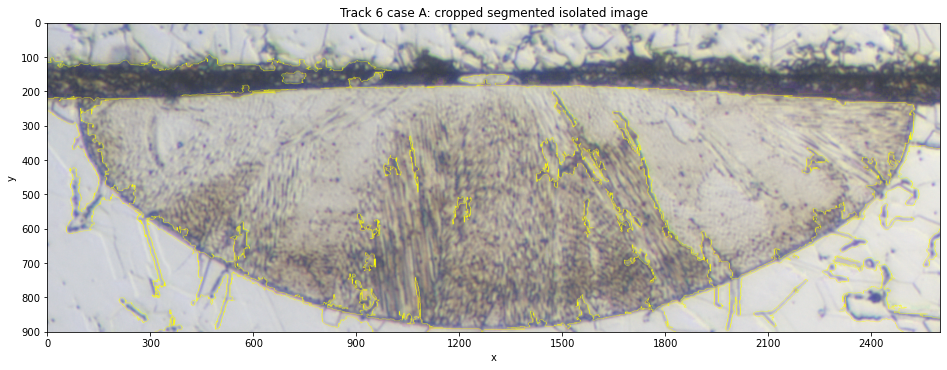

	Getting image 7 of 10: track 7 case A...
Direct link to image file: https://ambench.nist.gov/rest/blob/download/61e2e44f47ed0ce2c83c2089
showing marked image...


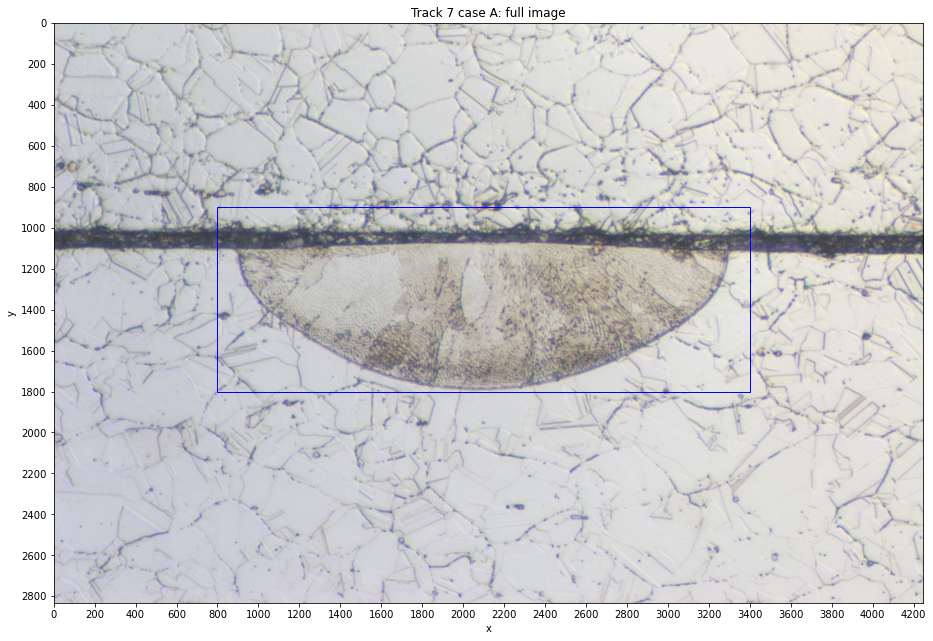

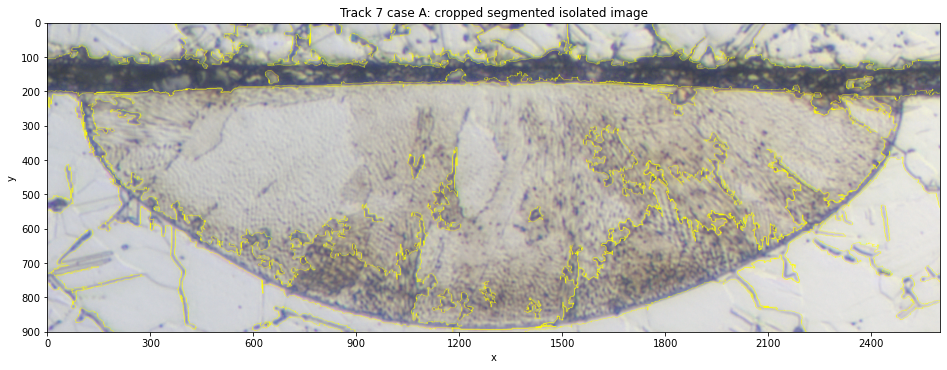

	Getting image 8 of 10: track 8 case B...
Direct link to image file: https://ambench.nist.gov/rest/blob/download/61e2e6ede0ade599482c5c20
showing marked image...


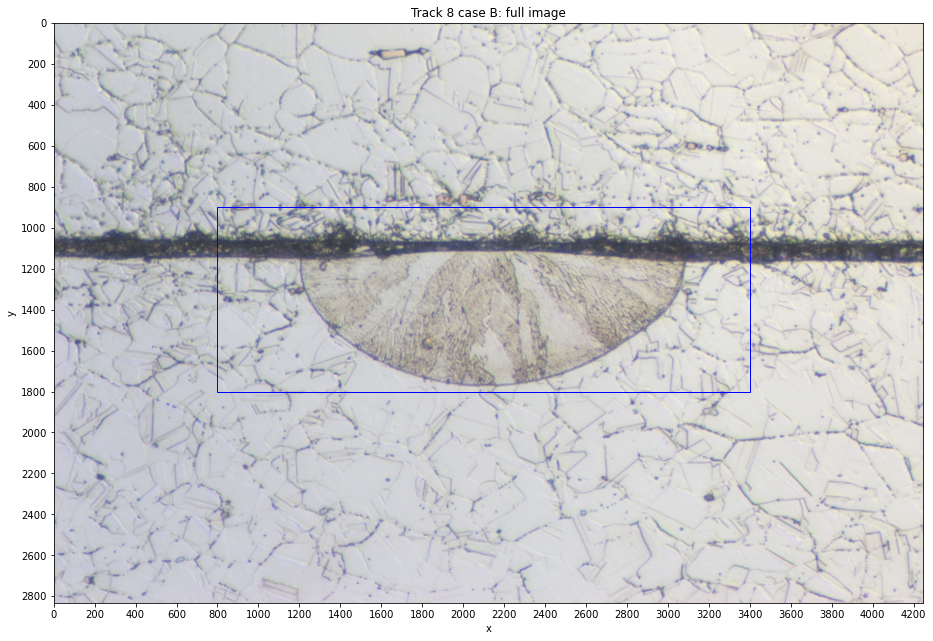

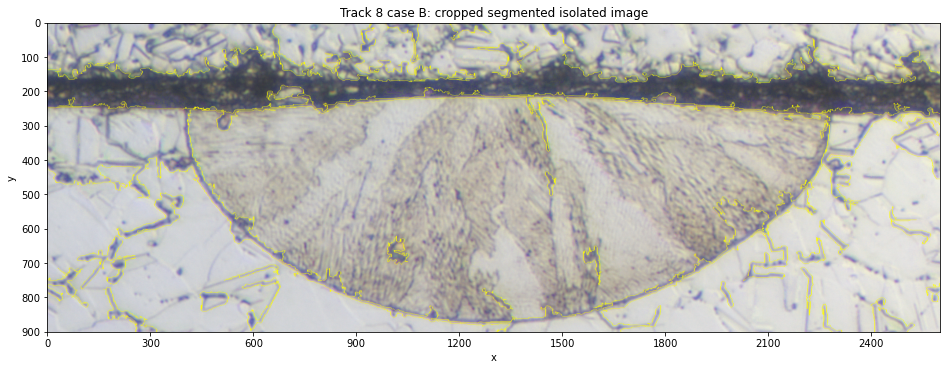

	Getting image 9 of 10: track 9 case B...
Direct link to image file: https://ambench.nist.gov/rest/blob/download/61e2e51cdaebe69a45e91632
showing marked image...


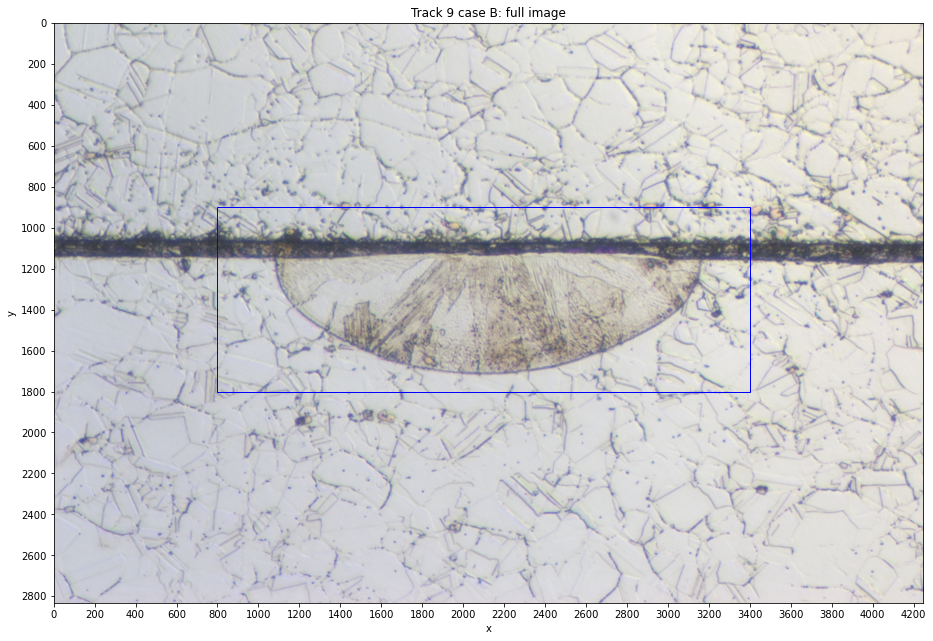

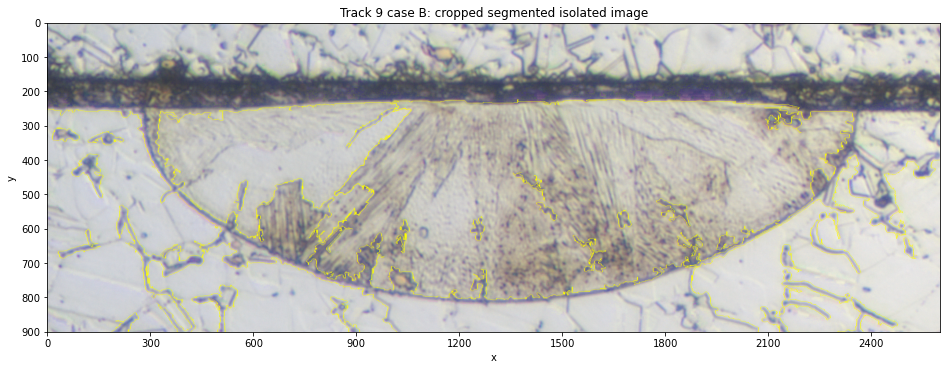

	Getting image 10 of 10: track 10 case B...
Direct link to image file: https://ambench.nist.gov/rest/blob/download/61e2e6287774703da98d09e4
showing marked image...


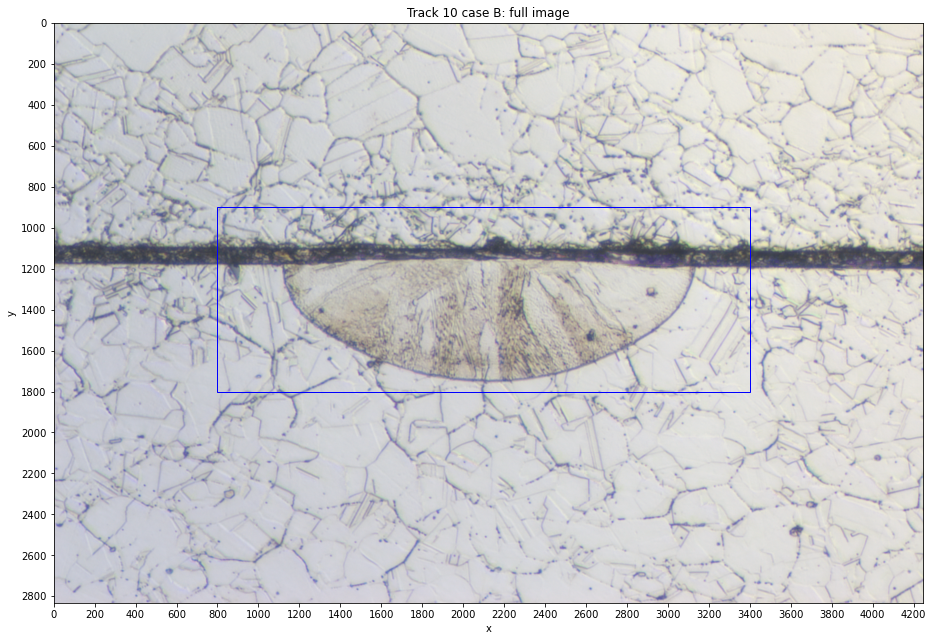

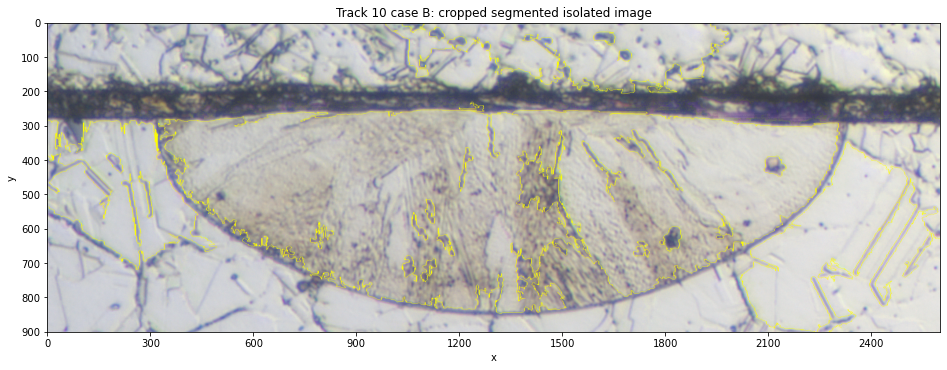

Done!


,track,case,melt_pool_width_microns,melt_pool_depth_microns
id,,,,
61e2e4c4b8edd76d53d3cb8e,1,C,101.246,31.620
61e2e6a3e0ade599482c5b77,2,C,100.936,31.992
61e2e653b8edd76d53d3d54f,3,C,99.200,34.100
61e2e580d682ae6fb2db87af,4,C,102.238,35.092
61e2e71747ed0ce2c83c23ac,5,A,143.406,46.252
61e2e74036f033d46e0672b4,6,A,156.612,50.034
61e2e46326f0a0b0e709c1df,7,A,145.948,44.888
61e2e700f51a62700be8516a,8,B,116.002,40.672
61e2e52fe0ade599482c58ba,9,B,98.766,36.146


In [6]:
show_images = True   # set to True to see what the images look like as they are found


print('Getting images...')
cnt = 0
for ix, thisrow in datasets_df.iterrows():
    #if (np.mod(cnt,5) == 0):
    print('\tGetting image {0:,.0f} of {1:,.0f}: track {2:,.0f} case {3:}...'.format(
        cnt+1, len(datasets_df), thisrow['track'], thisrow['case'])
         )
    print('Direct link to image file: {0:}'.format(thisrow['url']))
    # read file as an image
    this_image = io.imread(thisrow['url'])
    
    # To save processing time, the segmentation algorithm is applied to only part of the image
    ## The full image is 2832 pixels wide by 4248 pixels high
    ### This code copies and crops the image so that the analysis region is as follows:
    #### rectangle with coordinates 800 <= x <= 3400 , 900 <= y <= 1800
    cropim=this_image[900:1800,800:3400]
    
    # Use Felezenszwalb algorithm to autosegment cropped area
    segments=segmentation.felzenszwalb(cropim,scale=270,sigma=0.8,min_size=1000)

    # Remove small objects, which are likely background noise
    isolateim=morphology.remove_small_objects(segments,100000)

    
    # Find the center point of each segmented area, return as table
    center=measure.regionprops_table(isolateim,properties=['centroid'])
    
    if (show_images):
        center_points = []
        if (len(center['centroid-0']) == len(center['centroid-1'])):
            for i in range(0, len(center['centroid-0'])):
                center_points.append(tuple((center['centroid-1'][i], center['centroid-0'][i])))
    #            print("({0:}, {1:})".format(center['centroid-1'][i], center['centroid-0'][i]))
        else:
            print(len(center['centroid-0']))
            print(len(center['centroid-1']))
        
    # Loop through segments and calculate distance from centers to center of imagebox
    distances=[]
    for n in range(len(center['centroid-0'])):
        distances.append(math.dist([center['centroid-0'][n],center['centroid-1'][n]],[450,1300]))
#    print(distances)
    
        # Choose the region whose center is closest to imagebox center - that's the melt pool
    index=distances.index(min(distances)) #Looking for the region closest to the center of the image - should be the melt pool
    
    object_features=measure.regionprops(isolateim)
    
#    qqdf = pandas.DataFrame(measure.regionprops_table(isolateim))
    
#     for i in range(0, len(object_features)):
#         print(i)
#         print(object_features[i].bbox)
#         print('-----------')
    
    minr,minc,maxr,maxc = object_features[index].bbox
#    print(minr, minc, maxr, maxc)

    

#     print('Melt pool width in pixels: {0:.1f}'.format(maxc-minc))
#     print('\tMelt pool width in microns: {0:.1f}'.format((maxc-minc)*0.062))
    
#     print('Melt pool depth in pixels: {0:.1f}'.format(maxr-minr))
#     print('\tMelt pool depth in microns: {0:.1f}'.format((maxr-minr)*0.062))
    
    datasets_df.loc[ix, 'melt_pool_width_pixels'] = maxc-minc
    datasets_df.loc[ix, 'melt_pool_depth_pixels'] = maxr-minr
    
    datasets_df.loc[ix, 'melt_pool_width_microns'] = (maxc-minc)*0.062
    datasets_df.loc[ix, 'melt_pool_depth_microns'] = (maxr-minr)*0.062
    
    if (show_images):
        print('showing marked image...')
        fig, ax = plt.subplots(1,1,figsize=(16,16/1.5))
        ax.imshow(this_image)
        ax.set_title('Track {0:.0f} case {1:}: full image'.format(thisrow['track'], thisrow['case']))
        ax.set_xlim([0,4248])
        ax.set_xticks(np.arange(0,4300,200))
        ax.set_xlabel('x')
        ax.set_ylim([2832,0])
        ax.set_yticks(np.arange(2800,-200,-200))
        ax.set_ylabel('y')


        rect1 = patches.Rectangle((800,900), 2600, 900, linewidth=1, edgecolor='b', facecolor='none')
        ax.add_patch(rect1)

        fig2, ax2 = plt.subplots(1,1,figsize=(16,16/1.5))
        ax2.imshow(segmentation.mark_boundaries(cropim, isolateim))
        ax2.set_title('Track {0:.0f} case {1:}: cropped segmented isolated image'.format(thisrow['track'], thisrow['case']))
        ax2.set_xlim([0,2600])
        ax2.set_xticks(np.arange(0,2700,300))
        ax2.set_xlabel('x')
        ax2.set_ylim([900,0])
        ax2.set_yticks(np.arange(900,-100,-100))
        ax2.set_ylabel('y')      

        plt.show()

    cnt += 1



plt.show()
#qqdf

# Convert track number to integer, add new columns to summary table, sort by track
datasets_df.loc[:, 'track'] = pandas.to_numeric(
    datasets_df['track'], downcast='integer', errors='coerce'
)
datasets_df = datasets_df[
    ['title', 'track', 'case', 'melt_pool_width_pixels', 'melt_pool_depth_pixels', 'melt_pool_width_microns', 'melt_pool_depth_microns', 
     'template', 'workspace',  'creation_date', 'last_modification_date', 
     'last_change_date', 'filename', 'url', 'xml_content', 'template_title', 'user_id']
]
datasets_df = datasets_df.sort_values(by='track')

print('Done!')

# Print melt pool width and depth for each track/case
datasets_df[['track', 'case', 'melt_pool_width_microns', 'melt_pool_depth_microns']]


## 4. Make plots of melt pool sizes

Now that we have downloaded each image, run image processing algorithms, and calculated the size of each melt pool from image data, we can now plot the results. We will make a bar plot of widths and depths, and a scatterplot of width vs. depth.

###  Bar plot of melt pool widths

<AxesSubplot:xlabel='track'>

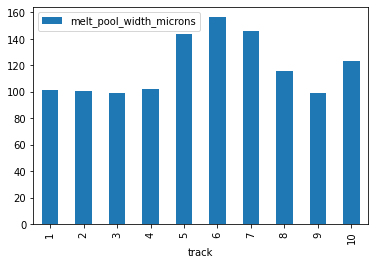

In [7]:
datasets_df[['melt_pool_width_microns', 'track']].plot(y='melt_pool_width_microns',x='track',kind='bar')

### Bar plot of melt pool depths

<AxesSubplot:xlabel='track'>

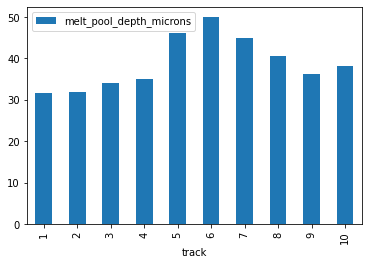

In [8]:
datasets_df[['melt_pool_depth_microns', 'track']].plot(y='melt_pool_depth_microns',x='track',kind='bar')

### Scatterplot of width vs. depth

<AxesSubplot:xlabel='melt_pool_depth_microns', ylabel='melt_pool_depth_microns'>

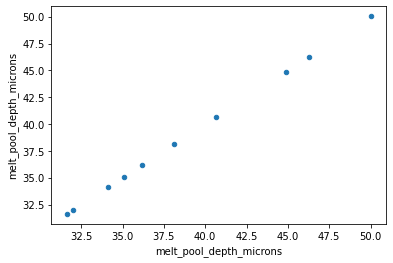

In [9]:
datasets_df.plot('melt_pool_depth_microns', 'melt_pool_depth_microns', kind='scatter')

This concludes the SciServer AMBench example notebook!

Please copy this notebook, save it into your <code>Storage/{username}/persistent</code> directory, and modify it to meet your needs.
